In [1]:
import pandas as pd
import numpy as np
import zipfile
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
from IPython.display import Video, display

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from imblearn.over_sampling import RandomOverSampler
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import mean_squared_error

In [2]:
with zipfile.ZipFile("nfl-player-contact-detection.zip") as z:
    with z.open("train_labels.csv") as f1:
        df_labels = pd.read_csv(f1)
    with z.open("train_baseline_helmets.csv") as f2:
        df_base_helmet = pd.read_csv(f2)
    with z.open("train_player_tracking.csv") as f3:
        df_player_track = pd.read_csv(f3)
    with z.open("train_video_metadata.csv") as f4:
        df_video_metadata = pd.read_csv(f4)

# EDA for labels

## train_labels.csv 
Contains a row for every combination of players, and players with the ground for each 0.1 second timestamp in the play.

- contact_id: A combination of the game_play, player_ids and step columns.
- game_play: the unique ID for the game and play.
- nfl_player_id_1 The lower numbered player id in the contact pair. If contact with ground then this is just the player id.
- nfl_player_id_2: The larger number player id in the contact pair. If for contact with the ground, this will contain an uppercase "G"
- step: A number representing each timestep for each play, starting at 0 at the moment of the play starting, and incrementing by 1 every 0.1 seconds.
- datetime: The timetamp of the contact, at 10Hz
- contact: Whether contact occurred


In [3]:
df_labels.shape

(4721618, 7)

In [4]:
df_labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4721618 entries, 0 to 4721617
Data columns (total 7 columns):
 #   Column           Dtype 
---  ------           ----- 
 0   contact_id       object
 1   game_play        object
 2   datetime         object
 3   step             int64 
 4   nfl_player_id_1  int64 
 5   nfl_player_id_2  object
 6   contact          int64 
dtypes: int64(3), object(4)
memory usage: 252.2+ MB


In [5]:
df_labels.head()

,contact_id,game_play,datetime,step,nfl_player_id_1,nfl_player_id_2,contact
0,58168_003392_0_38590_43854,58168_003392,2020-09-11T03:01:48.100Z,0,38590,43854,0
1,58168_003392_0_38590_41257,58168_003392,2020-09-11T03:01:48.100Z,0,38590,41257,0
2,58168_003392_0_38590_41944,58168_003392,2020-09-11T03:01:48.100Z,0,38590,41944,0
3,58168_003392_0_38590_42386,58168_003392,2020-09-11T03:01:48.100Z,0,38590,42386,0
4,58168_003392_0_38590_47944,58168_003392,2020-09-11T03:01:48.100Z,0,38590,47944,0


### Check when there is contact during the match: (always after 0)

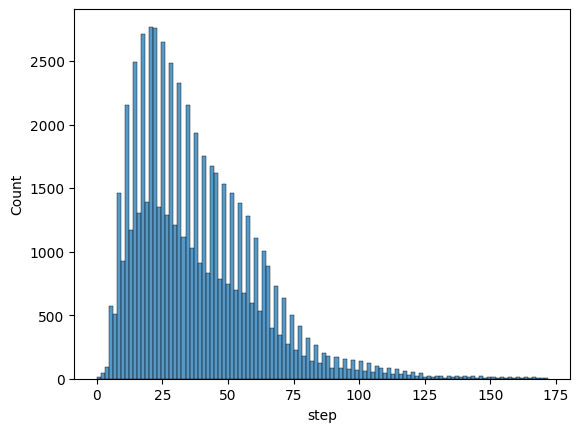

In [6]:
sns.histplot((df_labels.query("contact == 1").step));

### Check if there is always the same number of players:

In [7]:
df_labels.groupby(["game_play", "datetime"]).contact_id.count().reset_index().contact_id.unique()

array([253, 231], dtype=int64)

In [8]:
df_labels.groupby(["game_play", "datetime"]).contact_id.count().reset_index().loc[df_labels.groupby(["game_play", "datetime"]).contact_id.count().reset_index()["contact_id"]==231].game_play.unique()

array(['58538_002774'], dtype=object)

Sometime there is 22 players per teams (Combinaison of 22x21 /2 + 22 (when we have contact with the ground "G")), and for 1 play (= 58538_002774) we have 21 players (Combinaison of 21x20 /2 + 21)

# EDA for baseline_helmets

## train_baseline_helmets.csv
contains imperfect baseline predictions for helmet boxes and player assignments for the Sideline and Endzone video view.

- game_play: Unique game key and play id combination for the play.
- game_key: the ID code for the game.
- play_id: the ID code for the play.
- view: The video view, either Sideline or Endzone
- video: The filename of the associated video.
- frame: The associated frame within the video.
- nfl_player_id: The imperfect predicted player id.
- player_label: The player label. A combination of V/H (home or visiting team) and the player jersey number.
- [left/width/top/height]: the specification of the bounding box of the prediction.

In [9]:
df_base_helmet.shape

(3783616, 12)

In [10]:
df_base_helmet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3783616 entries, 0 to 3783615
Data columns (total 12 columns):
 #   Column         Dtype 
---  ------         ----- 
 0   game_play      object
 1   game_key       int64 
 2   play_id        int64 
 3   view           object
 4   video          object
 5   frame          int64 
 6   nfl_player_id  int64 
 7   player_label   object
 8   left           int64 
 9   width          int64 
 10  top            int64 
 11  height         int64 
dtypes: int64(8), object(4)
memory usage: 346.4+ MB


In [11]:
df_base_helmet.head()

,game_play,game_key,play_id,view,video,frame,nfl_player_id,player_label,left,width,top,height
0,58168_003392,58168,3392,Endzone,58168_003392_Endzone.mp4,290,39947,H72,946,25,293,34
1,58168_003392,58168,3392,Endzone,58168_003392_Endzone.mp4,290,37211,H42,151,25,267,33
2,58168_003392,58168,3392,Endzone,58168_003392_Endzone.mp4,290,38590,H70,810,25,293,35
3,58168_003392,58168,3392,Endzone,58168_003392_Endzone.mp4,290,44822,H15,681,26,254,33
4,58168_003392,58168,3392,Endzone,58168_003392_Endzone.mp4,290,41944,V92,680,23,303,33


### Vizualisation of the bbox

NEED TO BE DEFINED, IF WE WANT TO HAVE IT ON VIDEO OR IMAGE. NO PARTICULAR EDA

# EDA for player_tracking

## train_player_tracking.csv
Each player wears a sensor that allows us to locate them on the field:

- game_play: Unique game key and play id combination for the play.
- game_key: the ID code for the game.
- play_id: the ID code for the play.
- nfl_player_id: the player's ID code.
- datetime: timestamp at 10 Hz.
- step: timestep within play relative to the play start.
- position: the football position of the player.
- team: team of the player, either home or away.
- jersey_number: Player jersey number
- x_position: player position along the long axis of the field. See figure below.
- y_position: player position along the short axis of the field. See figure below.
- speed: speed in yards/second.
- distance: distance traveled from prior time point, in yards.
- orientation: orientation of player (deg).
- direction: angle of player motion (deg).
- acceleration: magnitiude of the total acceleration in yards/second^2.
- sa: Signed acceleration yards/second^2 in the direction the player is moving.


In [12]:
df_player_track.shape

(1353053, 17)

In [13]:
df_player_track.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1353053 entries, 0 to 1353052
Data columns (total 17 columns):
 #   Column         Non-Null Count    Dtype  
---  ------         --------------    -----  
 0   game_play      1353053 non-null  object 
 1   game_key       1353053 non-null  int64  
 2   play_id        1353053 non-null  int64  
 3   nfl_player_id  1353053 non-null  int64  
 4   datetime       1353053 non-null  object 
 5   step           1353053 non-null  int64  
 6   team           1353053 non-null  object 
 7   position       1353053 non-null  object 
 8   jersey_number  1353053 non-null  int64  
 9   x_position     1353053 non-null  float64
 10  y_position     1353053 non-null  float64
 11  speed          1353053 non-null  float64
 12  distance       1353053 non-null  float64
 13  direction      1353053 non-null  float64
 14  orientation    1353053 non-null  float64
 15  acceleration   1353053 non-null  float64
 16  sa             1353053 non-null  float64
dtypes: float

In [14]:
df_player_track.head()

,game_play,game_key,play_id,nfl_player_id,datetime,step,team,position,jersey_number,x_position,y_position,speed,distance,direction,orientation,acceleration,sa
0,58580_001136,58580,1136,44830,2021-10-10T21:08:20.900Z,-108,away,CB,22,61.59,42.60,1.11,0.11,320.33,263.93,0.71,-0.64
1,58580_001136,58580,1136,47800,2021-10-10T21:08:20.900Z,-108,away,DE,97,59.48,26.81,0.23,0.01,346.84,247.16,1.29,0.90
2,58580_001136,58580,1136,52444,2021-10-10T21:08:20.900Z,-108,away,FS,29,72.19,31.46,0.61,0.06,11.77,247.69,0.63,-0.33
3,58580_001136,58580,1136,46206,2021-10-10T21:08:20.900Z,-108,home,TE,86,57.37,22.12,0.37,0.04,127.85,63.63,0.69,0.62
4,58580_001136,58580,1136,52663,2021-10-10T21:08:20.900Z,-108,away,ILB,48,63.25,27.50,0.51,0.05,183.62,253.71,0.31,0.31


### Check if there is always the same number of players:

In [15]:
df_player_track.groupby(['game_play', 'play_id'])['nfl_player_id'].nunique().value_counts()

22    239
21      1
Name: nfl_player_id, dtype: int64

We can confirm that there is 1 play with 21 players and all others with 22 players

### Check the total number of players

In [16]:
print("Number of players:", df_player_track.nfl_player_id.nunique())
print("Number of game:", df_player_track.game_key.nunique())

Number of players: 1687
Number of game: 149


### Check if there is the same number of players in away teams and home teams 

In [17]:
home_players = df_player_track[df_player_track['team'] == "home"].jersey_number.unique()
visitor_players = df_player_track[df_player_track['team'] == "away"].jersey_number.unique()

len(home_players), len(visitor_players)
assert (set(home_players) - set(visitor_players)) == set()

# EDA for video_metadata

## train_video_metadata.csv 
Metadata for each sideline and endzone video file including the timestamp information to be used to sync with player tracking data.

- game_play: Unique game key and play id combination for the play.
- game_key: the ID code for the game.
- play_id: the ID code for the play.
- view: The video view, either Sideline or Endzone
- start_time: The timestamp of the video start.
- end_time: The timestamp when the video ends.
- snap_time: The timestamp when the play starts within the video. This is 5 seconds (300 frames) into the video.


In [18]:
df_video_metadata.shape

(480, 7)

In [19]:
df_video_metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 480 entries, 0 to 479
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   game_play   480 non-null    object
 1   game_key    480 non-null    int64 
 2   play_id     480 non-null    int64 
 3   view        480 non-null    object
 4   start_time  480 non-null    object
 5   end_time    480 non-null    object
 6   snap_time   480 non-null    object
dtypes: int64(2), object(5)
memory usage: 26.4+ KB


In [20]:
df_video_metadata.head()

,game_play,game_key,play_id,view,start_time,end_time,snap_time
0,58168_003392,58168,3392,Endzone,2020-09-11T03:01:43.134Z,2020-09-11T03:01:54.971Z,2020-09-11T03:01:48.134Z
1,58168_003392,58168,3392,Sideline,2020-09-11T03:01:43.134Z,2020-09-11T03:01:54.971Z,2020-09-11T03:01:48.134Z
2,58172_003247,58172,3247,Endzone,2020-09-13T19:30:42.414Z,2020-09-13T19:31:00.524Z,2020-09-13T19:30:47.414Z
3,58172_003247,58172,3247,Sideline,2020-09-13T19:30:42.414Z,2020-09-13T19:31:00.524Z,2020-09-13T19:30:47.414Z
4,58173_003606,58173,3606,Endzone,2020-09-13T19:45:07.527Z,2020-09-13T19:45:26.438Z,2020-09-13T19:45:12.527Z


### Check number of games and plays 

In [21]:
print("Number of games:", df_video_metadata.game_key.nunique())
print("Number of plays:", df_video_metadata.play_id.nunique())

#Game it's a football game and play is a video (each video have 2 sides)

Number of games: 149
Number of plays: 233


In [22]:
play_per_game = df_video_metadata.groupby('game_key')['play_id'].nunique().reset_index().groupby('play_id')['game_key'].unique().to_dict()

for key, value in play_per_game.items():
    print(f" {len(value)} games have {key} video (each have 2 sides vision)")

 89 games have 1 video (each have 2 sides vision)
 42 games have 2 video (each have 2 sides vision)
 10 games have 3 video (each have 2 sides vision)
 5 games have 4 video (each have 2 sides vision)
 1 games have 5 video (each have 2 sides vision)
 2 games have 6 video (each have 2 sides vision)


# Test Video play

In [23]:
with zipfile.ZipFile("nfl-player-contact-detection.zip") as z:
    z.extractall("")

os.chdir("train")

In [24]:
#TEST 2 OK 
def play_video(video_path, ratio=0.7):
    video = Video(video_path,
                  embed=True,
                  height=int(720 * ratio),
                  width=int(1280 * ratio))
    return video

play_video('C:/Users/mic/Downloads/train/58168_003392_Endzone.mp4')

In [25]:
#pip install plotly

In [27]:
df = df_player_track[['game_play', 'nfl_player_id', 'step', 'team', 'x_position', 'y_position', 
                      'datetime', "speed", "acceleration", "direction", "jersey_number"]]
df_colision1 = df_labels[['nfl_player_id_1', 'step', 'contact', 'game_play']].rename(columns={'nfl_player_id_1': 'nfl_player_id'}).drop_duplicates()
df_colision2 = df_labels[['nfl_player_id_2', 'step', 'contact', 'game_play']].rename(columns={'nfl_player_id_2': 'nfl_player_id'}).drop_duplicates()
df_colision2 = df_colision2[df_colision2['nfl_player_id'] != 'G']
df_colision2['nfl_player_id'] = df_colision2['nfl_player_id'].astype(int)
df_colision = pd.merge(df_colision1, df_colision2)
df_final = pd.merge(df, df_colision, on=['nfl_player_id', 'step', 'game_play'])

In [28]:
color_map = {0: 'green', 1: 'red'}
df_final['marker_color'] = df_final['contact'].replace(color_map)
df_final

,game_play,nfl_player_id,step,team,x_position,y_position,datetime,speed,acceleration,direction,jersey_number,contact,marker_color
0,58580_001136,41242,0,home,57.43,25.01,2021-10-10T21:08:31.700Z,0.63,1.05,28.14,70,0,green
1,58580_001136,43330,0,away,59.63,32.99,2021-10-10T21:08:31.700Z,0.17,0.46,169.43,55,0,green
2,58580_001136,52444,0,away,74.72,30.17,2021-10-10T21:08:31.700Z,2.86,0.71,134.28,29,0,green
3,58580_001136,52938,0,home,57.20,23.70,2021-10-10T21:08:31.700Z,0.77,1.24,11.77,78,0,green
4,58580_001136,43351,0,away,65.18,10.65,2021-10-10T21:08:31.700Z,0.39,0.62,69.38,24,0,green
...,...,...,...,...,...,...,...,...,...,...,...,...,...
399735,58575_003081,46915,72,home,102.76,44.41,2021-10-10T19:22:00.000Z,7.28,2.38,109.39,86,0,green
399736,58575_003081,44174,72,away,75.61,45.82,2021-10-10T19:22:00.000Z,1.84,0.37,349.74,49,0,green
399737,58575_003081,46192,72,away,101.22,40.88,2021-10-10T19:22:00.000Z,0.40,0.54,273.22,81,0,green
399738,58575_003081,44887,72,away,79.44,46.89,2021-10-10T19:22:00.000Z,1.36,0.48,316.09,45,0,green


In [29]:
import plotly.express as px

def football_animation(game_play):
    df_final["player"] = df_final["team"].str.upper().str[0] + df_final["jersey_number"].astype("str")
   
    df_final["track_time_count"] = (
        df_final.sort_values("datetime")
        .groupby("game_play")["datetime"]
        .rank(method="dense")
        .astype("int")
    )
    
    
    fig = px.scatter(
        df_final.query("game_play == @game_play")
        .groupby(["track_time_count"])
        .apply(lambda x: x.sort_values(["player"], ascending = False))# sort player number within the same tracking count (plotly scatter animation requirement),
        .reset_index(drop=True),
        
        x="x_position",
        y="y_position",
        range_x=[-10, 110],
        range_y=[-10, 53.3],
        hover_data=["player", "speed", "acceleration", "direction"],
        color="team",
        #marker=dict(color='white', line=dict(width=1, color=df_final['marker_color'])),
        #symbol = 'marker_color',
        animation_frame="track_time_count",
        text="player",
        title=f"Animation of NGS data for game_play {game_play}",
    )
    
    
    fig.update_traces(textfont_size=10#, 
                     #marker=dict(line=dict(width=1, color=df_final['marker_color']))
                     )
    fig = add_plotly_field(fig)
    fig.show()

In [30]:
import plotly.graph_objects as go
import plotly

def add_plotly_field(fig):
    fig.update_traces(marker_size=20)
    
    fig.update_layout(paper_bgcolor='#29a500', plot_bgcolor='#29a500', font_color='white',
        width = 800,
        height = 600,
        title = "",
        
        xaxis = dict(
        nticks = 10,
        title = "",
        visible=False
        ),
        
        yaxis = dict(
        scaleanchor = "x",
        title = "Temp",
        visible=False
        ),
        showlegend= True,
  
        annotations=[
       dict(
            x=-5,
            y=26.65,
            xref="x",
            yref="y",
            text="ENDZONE",
            font=dict(size=16,color="#e9ece7"),
            align='center',
            showarrow=False,
            yanchor='middle',
            textangle=-90
        ),
        dict(
            x=105,
            y=26.65,
            xref="x",
            yref="y",
            text="ENDZONE",
            font=dict(size=16,color="#e9ece7"),
            align='center',
            showarrow=False,
            yanchor='middle',
            textangle=90
        )]  
        ,
        legend=dict(
        traceorder="normal",
        font=dict(family="sans-serif",size=12),
        title = "",
        orientation="h",
        yanchor="bottom",
        y=1.00,
        xanchor="center",
        x=0.5
        ),
    )
        
    fig.add_shape(type="rect", x0=-10, x1=0,  y0=0, y1=53.3,line=dict(color="#c8ddc0",width=3),fillcolor="#217b00" ,layer="below")
    fig.add_shape(type="rect", x0=100, x1=110, y0=0, y1=53.3,line=dict(color="#c8ddc0",width=3),fillcolor="#217b00" ,layer="below")
    for x in range(0, 100, 10):
        fig.add_shape(type="rect", x0=x,   x1=x+10, y0=0, y1=53.3,line=dict(color="#c8ddc0",width=3),fillcolor="#29a500" ,layer="below")
    for x in range(0, 100, 1):
        fig.add_shape(type="line",x0=x, y0=1, x1=x, y1=2,line=dict(color="#c8ddc0",width=2),layer="below")
    for x in range(0, 100, 1):
        fig.add_shape(type="line",x0=x, y0=51.3, x1=x, y1=52.3,line=dict(color="#c8ddc0",width=2),layer="below")
    
    for x in range(0, 100, 1):
        fig.add_shape(type="line",x0=x, y0=20.0, x1=x, y1=21,line=dict(color="#c8ddc0",width=2),layer="below")
    for x in range(0, 100, 1):
        fig.add_shape(type="line",x0=x, y0=32.3, x1=x, y1=33.3,line=dict(color="#c8ddc0",width=2),layer="below")
    
    
    fig.add_trace(go.Scatter(
    x=[2,10,20,30,40,50,60,70,80,90,98], 
    y=[5,5,5,5,5,5,5,5,5,5,5],
    text=["G","1 0","2 0","3 0","4 0","5 0","4 0","3 0","2 0","1 0","G"],
    mode="text",
    textfont=dict(size=20,family="Arail"),
    showlegend=False,
    ))
    
    fig.add_trace(go.Scatter(
    x=[2,10,20,30,40,50,60,70,80,90,98], 
    y=[48.3,48.3,48.3,48.3,48.3,48.3,48.3,48.3,48.3,48.3,48.3],
    text=["G","1 0","2 0","3 0","4 0","5 0","4 0","3 0","2 0","1 0","G"],
    mode="text",
    textfont=dict(size=20,family="Arail"),
    showlegend=False,
    ))
    
    return fig

In [31]:
football_animation('58168_003392')